# MANUAL NET ARCHITECTURE

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import os
import glob
import numpy as np

from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.models import Sequential
from PIL import Image

from tensorflow.keras.layers import Convolution2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Activation

from keras.callbacks import ModelCheckpoint
import matplotlib.pyplot as plt

In [3]:
Apple_Affected = 'DATASET/TRAIN/Apple_Affected'
Apple_healthy = 'DATASET/TRAIN/Apple_healthy'
Grape_Affected = 'DATASET/TRAIN/Grape_Affected'
Grape_healthy = 'DATASET/TRAIN/Grape_healthy'
Potato_Affected = 'DATASET/TRAIN/Potato_Affected'
Potato_healthy = 'DATASET/TRAIN/Potato_healthy'
Strawberry_Affected = 'DATASET/TRAIN/Strawberry_Affected'
Strawberry_healthy = 'DATASET/TRAIN/Strawberry_healthy'
Tomato_Affected = 'DATASET/TRAIN/Tomato_Affected'
Tomato_healthy = 'DATASET/TRAIN/Tomato_healthy'

In [4]:
def plot_images(item_dir, n=6):
    all_item_dir = os.listdir(item_dir)
    item_files = [os.path.join(item_dir, file) for file in all_item_dir][:n]
    
    plt.figure(figsize=(80, 40))
    for idx, img_path in enumerate(item_files):
        plt.subplot(3, n, idx+1)
        img = plt.imread(img_path)
        plt.imshow(img, cmap='gray')
        plt.axis('off')
    
    plt.tight_layout()
    
def image_details_print(data,path):
    print('======== Images in: ', path)
    for key,values in data.items():
        print(key,':\t', values)


def images_details(path):
    files=[f for f in glob.glob(path + "**/*.*", recursive=True)]
    data={}
    data['Images_count']=len(files)
    data['Min_width']=10**100
    data['Max_width']=0
    data['Min_height']=10**100
    data['Max_height']=0
    
    for f in files:
        img=Image.open(f)
        width,height=img.size
        data['Min_width']=min(width,data['Min_width'])
        data['Max_width']=max(width, data['Max_width'])
        data['Min_height']=min(height, data['Min_height'])
        data['Max_height']=max(height, data['Max_height'])
        
    image_details_print(data,path)


TRAINING DATA FOR Apple Affected:

======== Images in:  DATASET/TRAIN/Apple_Affected
Images_count :	 200
Min_width :	 256
Max_width :	 256
Min_height :	 256
Max_height :	 256



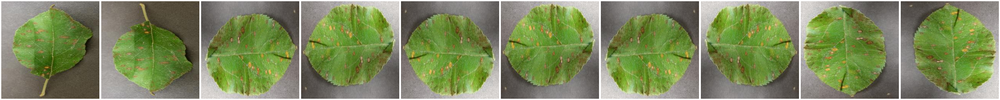

In [5]:
print("")
print("TRAINING DATA FOR Apple Affected:")
print("")
images_details(Apple_Affected)
print("")
plot_images(Apple_Affected, 10) 


TRAINING DATA FOR Apple healthy:

======== Images in:  DATASET/TRAIN/Apple_healthy
Images_count :	 200
Min_width :	 256
Max_width :	 256
Min_height :	 256
Max_height :	 256



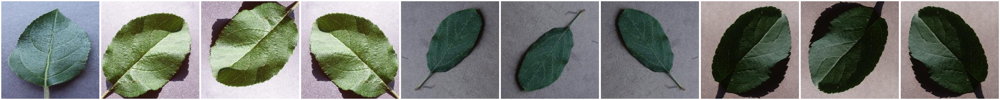

In [6]:
print("")
print("TRAINING DATA FOR Apple healthy:")
print("")
images_details(Apple_healthy)
print("")
plot_images(Apple_healthy, 10)


TRAINING DATA FOR Grape_Affected:

======== Images in:  DATASET/TRAIN/Grape_Affected
Images_count :	 199
Min_width :	 256
Max_width :	 256
Min_height :	 256
Max_height :	 256



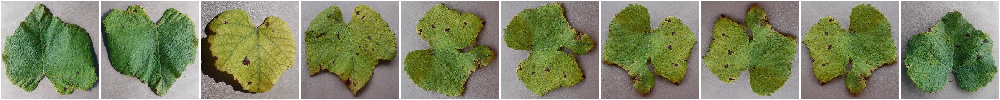

In [7]:
print("")
print("TRAINING DATA FOR Grape_Affected:")
print("")
images_details(Grape_Affected)
print("")
plot_images(Grape_Affected, 10)


TRAINING DATA FOR Strawberry_Affected:

======== Images in:  DATASET/TRAIN/Strawberry_Affected
Images_count :	 200
Min_width :	 256
Max_width :	 256
Min_height :	 256
Max_height :	 256



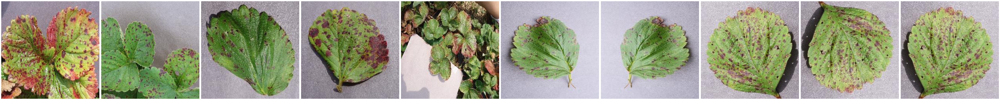

In [8]:
print("")
print("TRAINING DATA FOR Strawberry_Affected:")
print("")
images_details(Strawberry_Affected)
print("")
plot_images(Strawberry_Affected, 10)


TRAINING DATA FOR Strawberry_healthy:

======== Images in:  DATASET/TRAIN/Strawberry_healthy
Images_count :	 200
Min_width :	 256
Max_width :	 256
Min_height :	 256
Max_height :	 256



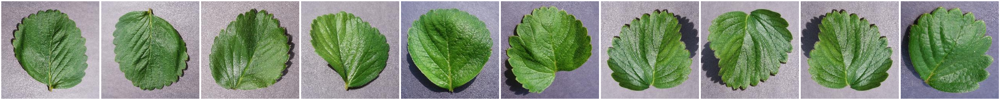

In [9]:
print("")
print("TRAINING DATA FOR Strawberry_healthy:")
print("")
images_details(Strawberry_healthy)
print("")
plot_images(Strawberry_healthy, 10)


TRAINING DATA FOR Tomato_healthy:

======== Images in:  DATASET/TRAIN/Tomato_healthy
Images_count :	 200
Min_width :	 256
Max_width :	 256
Min_height :	 256
Max_height :	 256



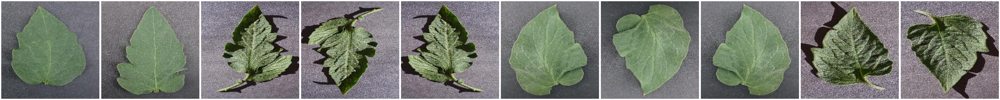

In [10]:
print("")
print("TRAINING DATA FOR Tomato_healthy:")
print("")
images_details(Tomato_healthy)
print("")
plot_images(Tomato_healthy, 10)

In [11]:
train_datagen=ImageDataGenerator(rescale=1./255,shear_range=0.2,zoom_range=0.2,horizontal_flip=True)
training_set=train_datagen.flow_from_directory('dataset/train',target_size=(224,224),batch_size=32,class_mode='categorical')

Found 2000 images belonging to 10 classes.


In [12]:
test_datagen=ImageDataGenerator(rescale=1./255)
test_set=test_datagen.flow_from_directory('dataset/test',target_size=(224,224),batch_size=32,class_mode='categorical')

Found 2000 images belonging to 10 classes.


In [13]:
Classifier=Sequential()
Classifier.add(Convolution2D(32,(3,3),input_shape=(224,224,3),activation='relu'))
Classifier.add(MaxPooling2D(pool_size=(2,2)))
Classifier.add(Flatten())
Classifier.add(Dense(38, activation='relu'))
Classifier.add(Dense(10, activation='softmax'))
Classifier.compile(optimizer='rmsprop',loss='categorical_crossentropy',metrics=['accuracy'])

In [14]:
model_path = "MANUAL.h5"

callbacks = [
    ModelCheckpoint(model_path, monitor='accuracy', verbose=1, save_best_only=True)
]

In [15]:
epochs = 10
batch_size = 512

In [16]:
#### Fitting the model
history = Classifier.fit(
           training_set, steps_per_epoch=training_set.samples // batch_size, 
           epochs=epochs, 
           validation_data=test_set,validation_steps=test_set.samples // batch_size,
           callbacks=callbacks)

Epoch 1/10
3/3 [==============================] - ETA: 0s - loss: 112.8451 - accuracy: 0.0833
Epoch 1: accuracy improved from -inf to 0.08333, saving model to MANUAL.h5
3/3 [==============================] - 4s 1s/step - loss: 112.8451 - accuracy: 0.0833 - val_loss: 72.9072 - val_accuracy: 0.0938
Epoch 2/10
3/3 [==============================] - ETA: 0s - loss: 44.6266 - accuracy: 0.0729
Epoch 2: accuracy did not improve from 0.08333
3/3 [==============================] - 3s 1s/step - loss: 44.6266 - accuracy: 0.0729 - val_loss: 27.2082 - val_accuracy: 0.0833
Epoch 3/10
3/3 [==============================] - ETA: 0s - loss: 26.1619 - accuracy: 0.0625
Epoch 3: accuracy did not improve from 0.08333
3/3 [==============================] - 3s 1s/step - loss: 26.1619 - accuracy: 0.0625 - val_loss: 10.4288 - val_accuracy: 0.1250
Epoch 4/10
3/3 [==============================] - ETA: 0s - loss: 6.5069 - accuracy: 0.0729
Epoch 4: accuracy did not improve from 0.08333
3/3 [======================

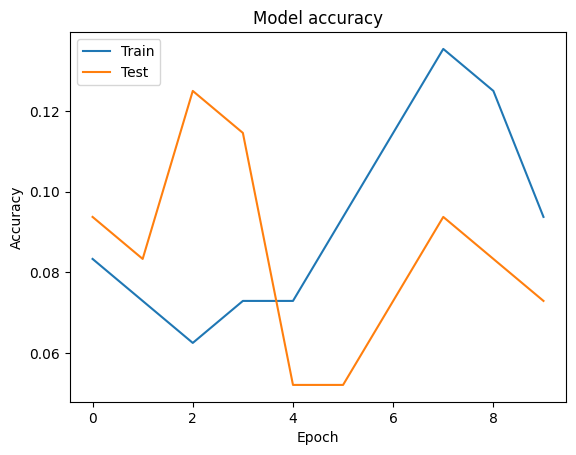

In [17]:
import matplotlib.pyplot as plt

def graph():
    #Plot training & validation accuracy values
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()

graph()

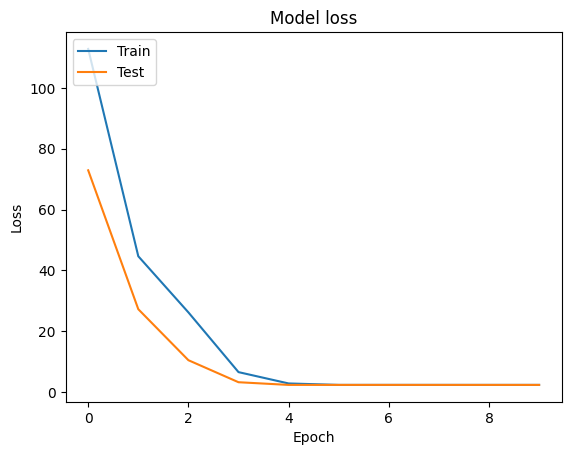

In [18]:
import matplotlib.pyplot as plt

def graph():
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()
graph()